### Paso 1: Importar todos los modulos y librerías

In [2]:
!pip install -q imageio
!pip install tensorflow
!pip install tensorflow_hub
!pip install tensorflow_docs

In [3]:
# Tensorflow y TF-Hub Modulos
from absl import logging
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow_docs.vis import embed

logging.set_verbosity(logging.ERROR)

# Algunos módulos que ayudaran a leer el dataset UCF101
import random
import re
import os
import tempfile
import ssl
import cv2
import numpy as np

# Algunos modulos para mostrar una animacion usando imageio
import imageio
from IPython import display
from urllib import request


### Paso 2: Funciones auxiliares para el dataset UCF101

In [20]:
# Utilidades para obtener los videos del dataset UCF 101
UCF_ROOT = "https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/"
_VIDEO_LIST = None
_CACHE_DIR = tempfile.mkdtemp()
unverified_context = ssl._create_unverified_context()

def list_ucf_videos():
    global _VIDEO_LIST
    if not _VIDEO_LIST:
        index = request.urlopen(UCF_ROOT,context= unverified_context).read().decode("utf-8")
        videos = re.findall("(v_[\w_]+\.avi)",index)
        _VIDEO_LIST = sorted(set(videos))
        return list(_VIDEO_LIST)
    
    
def fetch_ucf_video(video):
    cache_path = os.path.join(_CACHE_DIR,video)
    if not os.path.exists(cache_path):
        urlpath = request.urljoin(UCF_ROOT,video)
        print("Fetching %s => %s"%(urlpath,cache_path))
        data = request.urlopen(urlpath,context=unverified_context).read()
        open(cache_path,"wb").write(data)
        return cache_path  
      
    
def crop_center_square(frame):
    y,x = frame.shape[0:2]
    min_dim = min(y,x)
    start_x = (x//2)-(min_dim//2)
    start_y = (y//2)-(min_dim//2)
    return frame[start_y:start_y+min_dim,start_x:start_x+min_dim]
    
def load_video(path,max_frames=0,resize = (224,224)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while True:
            ret,frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame,resize)
            frame = frame[:,:,[2,1,0]]
            frames.append(frame)
                
            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)/255.0
       
def to_gif(images):
    converted_images = np.clip(images*255,0,255).astype(np.uint8)
    imageio.mimsave('./animation.gif',converted_images,fps = 25)
    return embed.embed_file('./animation.gif')
    

### Paso 3: Obtener las 400 etiquetas

In [21]:
KINETICS_URL = "https://raw.githubusercontent.com/deepmind/kinetics-i3d/master/data/label_map.txt"
with request.urlopen(KINETICS_URL) as obj:
    labels = [line.decode("utf-8").strip() for line in obj.readlines()]
    print("Se encontraron en total %d etiquetas."%len(labels))

Se encontraron en total 400 etiquetas.


### Paso 4: Obtener el dataset UCF101

In [22]:
ucf_videos = list_ucf_videos()
categories = {}
for video in ucf_videos:
    category = video[2:-12]
    if category not in categories:
        categories[category] = []
    categories[category].append(video)
print("Se encontraron en total %d videos dentro de %d categorías."%(len(ucf_videos),len(categories)))
    
print("\n")
head1 = "CATEGORY"
head2 = "No. de Videos"
head3 = "Detalles"
print(" ",head1,"\t ",head2,"\t\t\t",head3)
    
for category,sequences in categories.items():
    summary = ",".join(sequences[:2])
    print("%-20s  %4d   %s, ..."%(category,len(sequences),summary))

Se encontraron en total 13320 videos dentro de 101 categorías.


  CATEGORY 	  No. de Videos 			 Detalles
ApplyEyeMakeup         145   v_ApplyEyeMakeup_g01_c01.avi,v_ApplyEyeMakeup_g01_c02.avi, ...
ApplyLipstick          114   v_ApplyLipstick_g01_c01.avi,v_ApplyLipstick_g01_c02.avi, ...
Archery                145   v_Archery_g01_c01.avi,v_Archery_g01_c02.avi, ...
BabyCrawling           132   v_BabyCrawling_g01_c01.avi,v_BabyCrawling_g01_c02.avi, ...
BalanceBeam            108   v_BalanceBeam_g01_c01.avi,v_BalanceBeam_g01_c02.avi, ...
BandMarching           155   v_BandMarching_g01_c01.avi,v_BandMarching_g01_c02.avi, ...
BaseballPitch          150   v_BaseballPitch_g01_c01.avi,v_BaseballPitch_g01_c02.avi, ...
BasketballDunk         131   v_BasketballDunk_g01_c01.avi,v_BasketballDunk_g01_c02.avi, ...
Basketball             134   v_Basketball_g01_c01.avi,v_Basketball_g01_c02.avi, ...
BenchPress             160   v_BenchPress_g01_c01.avi,v_BenchPress_g01_c02.avi, ...
Biking                

### Paso 5: Buscar un video aleatorio

In [23]:
video_path = fetch_ucf_video("v_LongJump_g01_c01.avi")
sample_video = load_video(video_path)
sample_video1 = load_video(video_path)[:100]
sample_video.shape

Fetching https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/v_LongJump_g01_c01.avi => C:\Users\OMAR~1.LUN\AppData\Local\Temp\tmpninegn73\v_LongJump_g01_c01.avi


(143, 224, 224, 3)


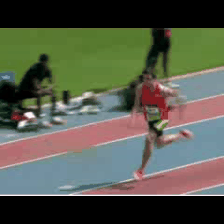

In [24]:
to_gif(sample_video1)

### Paso 6: Predecir sobre el video

In [25]:
i3d = hub.load("https://tfhub.dev/deepmind/i3d-kinetics-400/1").signatures['default']

In [26]:
def predict(sample_video):
    model_input = tf.constant(sample_video,dtype=tf.float32)[tf.newaxis, ...]
    
    logits = i3d(model_input)['default'][0]
    probabilities = tf.nn.softmax(logits)
    
    print("Top 5 actions")
    for i in np.argsort(probabilities)[::-1][:5]:
        print(f" {labels[i]:22}:{probabilities[i]* 100:5.2f}%")

In [27]:
predict(sample_video)

Top 5 actions
 long jump             :62.05%
 triple jump           :37.88%
 hurdling              : 0.06%
 pole vault            : 0.01%
 high jump             : 0.00%


#### Probar con otro video

In [28]:
video_path = fetch_ucf_video("v_WritingOnBoard_g01_c01.avi")
sample_video = load_video(video_path)
sample_video1 = load_video(video_path)[:100]
sample_video.shape

Fetching https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/v_WritingOnBoard_g01_c01.avi => C:\Users\OMAR~1.LUN\AppData\Local\Temp\tmpninegn73\v_WritingOnBoard_g01_c01.avi


(153, 224, 224, 3)


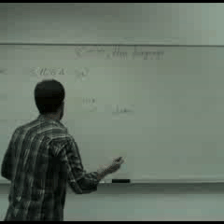

In [30]:
to_gif(sample_video1)

In [32]:
predict(sample_video)

Top 5 actions
 writing               :99.85%
 spray painting        : 0.01%
 beatboxing            : 0.01%
 ice fishing           : 0.01%
 smoking               : 0.01%


In [33]:
video_path = fetch_ucf_video("v_PlayingGuitar_g01_c01.avi")
sample_video = load_video(video_path)
sample_video1 = load_video(video_path)[:100]
sample_video.shape

Fetching https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/v_PlayingGuitar_g01_c01.avi => C:\Users\OMAR~1.LUN\AppData\Local\Temp\tmpninegn73\v_PlayingGuitar_g01_c01.avi


(250, 224, 224, 3)


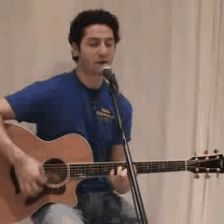

In [36]:
to_gif(sample_video1)

In [37]:
predict(sample_video)

Top 5 actions
 playing guitar        :68.83%
 strumming guitar      :27.55%
 beatboxing            : 0.90%
 busking               : 0.79%
 recording music       : 0.52%
